# Task 1: Import the necessary Libraries


In [1]:
#import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
%matplotlib inline

#load Data
df = pd.read_csv('employee_turnover.data.txt')

# Task 2: Read in the dataset

In [2]:
#display HR dataset
df.head ()

,satisfaction,evaluation,number_of_projects,average_montly_hours,time_spend_company,work_accident,churn,promotion,department,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.11,0.88,7,272,4,0,1,0,sales,medium
3,0.72,0.87,5,223,5,0,1,0,sales,low
4,0.37,0.52,2,159,3,0,1,0,sales,low


# Taks 3: Renameing and mapping column 

In [3]:
#change name from sales to department
df=df.rename(columns = {'sales':'department'})

#change name from promotions to promotion_last_5years
df=df.rename(columns = {'promotion':'promotion_last_5years'})


In [4]:
#show dataset unique departments
df['department'].unique()

array(['sales', 'accounting', 'hr', 'technical', 'support', 'management',
       'IT', 'product_mng', 'marketing', 'RandD'], dtype=object)

In [5]:
#dataset department mappings
df['department']=np.where(df['department'] =='support', 'technical', df['department'])
df['department']=np.where(df['department'] =='IT', 'technical', df['department'])

In [6]:
#display columns, deparment is visible
df.dtypes

satisfaction             float64
evaluation               float64
number_of_projects         int64
average_montly_hours       int64
time_spend_company         int64
work_accident              int64
churn                      int64
promotion_last_5years      int64
department                object
salary                    object
dtype: object

# Task 4: Explore The Data

In [7]:
#shape display
df.shape

(14999, 10)

In [8]:
#any missing values? No
df.isnull().any()

satisfaction             False
evaluation               False
number_of_projects       False
average_montly_hours     False
time_spend_company       False
work_accident            False
churn                    False
promotion_last_5years    False
department               False
salary                   False
dtype: bool

In [9]:
#get the total number of observations and save it as the number of employees
number_of_employees = len(df)

#print the number of employees who churned/stayed
print(df.churn.value_counts())


0    11428
1     3571
Name: churn, dtype: int64


In [10]:
#print the percentage of employees who churned/stayed
print(df.churn.value_counts()/number_of_employees*100)

0    76.191746
1    23.808254
Name: churn, dtype: float64


# Task 4: Explore Data Statistics

Explore the data file Statistical Description, Correlations and types of Data within the data file.

In [11]:
#print the data set statistics
df.describe()

,satisfaction,evaluation,number_of_projects,average_montly_hours,time_spend_company,work_accident,churn,promotion_last_5years
count,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000
mean,0.612834,0.716102,3.803054,201.050337,3.498233,0.144610,0.238083,0.021268
std,0.248631,0.171169,1.232592,49.943099,1.460136,0.351719,0.425924,0.144281
min,0.090000,0.360000,2.000000,96.000000,2.000000,0.000000,0.000000,0.000000
25%,0.440000,0.560000,3.000000,156.000000,3.000000,0.000000,0.000000,0.000000
50%,0.640000,0.720000,4.000000,200.000000,3.000000,0.000000,0.000000,0.000000
75%,0.820000,0.870000,5.000000,245.000000,4.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,7.000000,310.000000,10.000000,1.000000,1.000000,1.000000


In [12]:
#print statistical description
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 10 columns):
satisfaction             14999 non-null float64
evaluation               14999 non-null float64
number_of_projects       14999 non-null int64
average_montly_hours     14999 non-null int64
time_spend_company       14999 non-null int64
work_accident            14999 non-null int64
churn                    14999 non-null int64
promotion_last_5years    14999 non-null int64
department               14999 non-null object
salary                   14999 non-null object
dtypes: float64(2), int64(6), object(2)
memory usage: 1.1+ MB


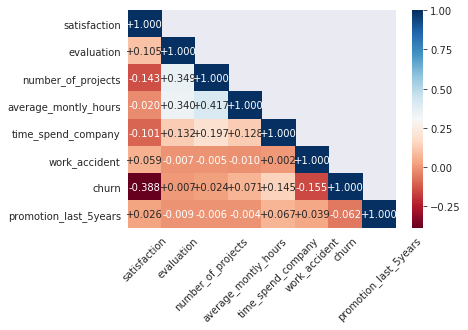

In [13]:
#print correlation of dataset
import seaborn as sns
import matplotlib.pyplot as plt

corr = df.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask, 1)] = True
with sns.axes_style("dark"):
    ax = sns.heatmap(corr, mask=mask, annot=True,
                     cmap='RdBu', fmt='+.3f')
    plt.xticks(rotation=45, ha='center')

#print and produce a scatter matrix for each pair of features in the data
pd.scatter_matrix(df, alpha = 0.3, figsize = (14,8), diagonal = 'kde');

In [14]:
#print the mean of churning in concern with features
df.groupby('churn').mean()

,satisfaction,evaluation,number_of_projects,average_montly_hours,time_spend_company,work_accident,promotion_last_5years
churn,,,,,,,
0,0.666810,0.715473,3.786664,199.060203,3.380032,0.175009,0.026251
1,0.440098,0.718113,3.855503,207.419210,3.876505,0.047326,0.005321


In [15]:
#print statistics on churning and departments
pd.crosstab(df.department, df.churn)

churn,0,1
department,,
RandD,666,121
accounting,563,204
hr,524,215
management,539,91
marketing,655,203
product_mng,704,198
sales,3126,1014
technical,4651,1525


# Task 5: Visualizing Data 

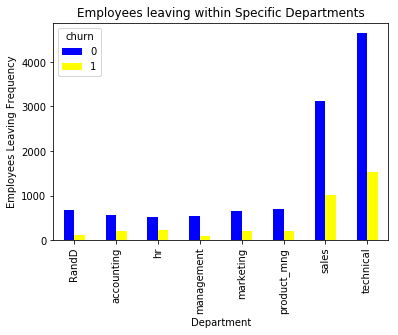

In [16]:
#produce a visual representation of churning within the departments
%matplotlib inline
import matplotlib.pyplot as plt
pd.crosstab(df.department,df.churn).plot(kind='bar', color=['blue', 'yellow'])
plt.title('Turnover Frequency for Department')
plt.title('Employees leaving within Specific Departments')
plt.xlabel('Department')
plt.ylabel('Employees Leaving Frequency')
plt.savefig('department_bar_chart')

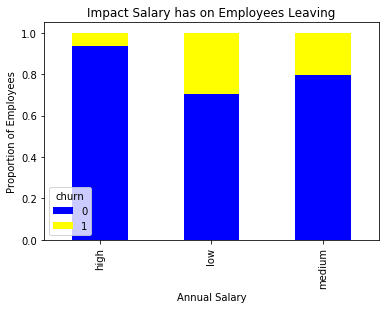

In [17]:
#produce a visual representation of churning against salary levels
table=pd.crosstab(df.salary, df.churn)
table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True, color=['blue', 'yellow'])
plt.title('Stacked Bar Chart of Salary Level vs Turnover')
plt.title('Impact Salary has on Employees Leaving')
plt.xlabel('Annual Salary')
plt.ylabel('Proportion of Employees')
plt.savefig('salary_bar_chart')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a20621860>,
      dtype=object)

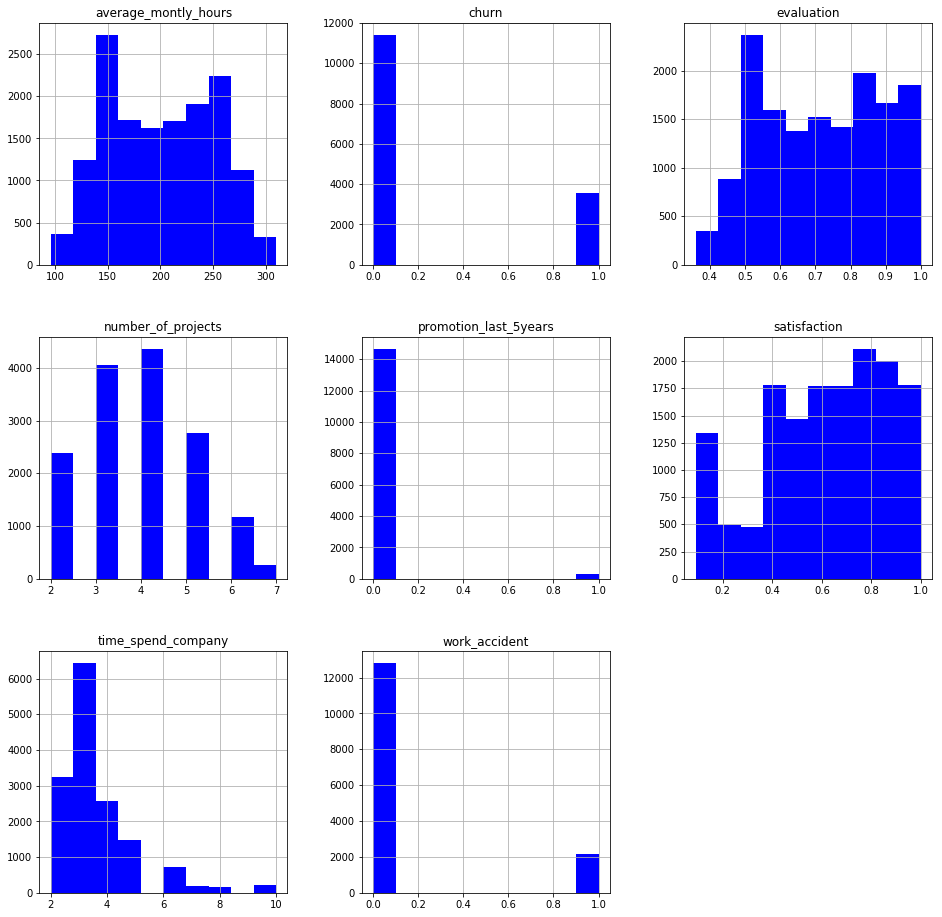

In [18]:
#histogram 
df.hist(figsize=(16,16), color=['blue'])

# Task 6: Create Dummy Varibles

In [19]:
#Create dummy varibles for department and salary
cat_vars=['department','salary']
for var in cat_vars:
    cat_list='var'+'_'+var
    cat_list = pd.get_dummies(df[var], prefix=var)
    hr1=df.join(cat_list)
    df=hr1

In [20]:
#drop columns 8 and 9
df.drop(df.columns[[8, 9]], axis=1, inplace=True)
df.columns.values

array(['satisfaction', 'evaluation', 'number_of_projects',
       'average_montly_hours', 'time_spend_company', 'work_accident',
       'churn', 'promotion_last_5years', 'department_RandD',
       'department_accounting', 'department_hr', 'department_management',
       'department_marketing', 'department_product_mng',
       'department_sales', 'department_technical', 'salary_high',
       'salary_low', 'salary_medium'], dtype=object)

# Task 8: Seperating Targets and Features

In [21]:
#set columns, targets and features
cols=['satisfaction', 'evaluation', 'time_spend_company', 'work_accident', 'promotion_last_5years', 
      'department_RandD', 'department_hr', 'department_management', 'salary_high', 'salary_low'] 
features=df[cols]
target=df['churn']


# Task 9: Splitting Data into Training and Test Split

In [22]:
#split test and training set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.3, random_state =42)


# Task 8: Computing Gini index

In [23]:
#number of people who stayed/churn
stayed = 37
churn = 1138

#sum of stayed and churn
total = stayed + churn

#gini index
gini = 2*(stayed/total)*(churn/total)

# Gini index in case of splitting by variable A or B
gini_A = 0.65
gini_B = 0.15

# check which Gini is lower and use it for splitting
if gini_A < gini_B:
    print("split by A!")
else:
    print("split by B!")

split by B!


# Task 9: Decision Tree

##### Fit Decision Tree 

In [24]:
#import the classification algorithm
from sklearn.tree import DecisionTreeClassifier, export_graphviz, export

#initialize it and call model by specifying the random_state parameter
dt = DecisionTreeClassifier(random_state=42)

#apply a decision tree model to fit features to the target
dt.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=42,
            splitter='best')

##### Evaluating Desicion Tree Model

In [25]:
#check the accuracy score of the prediction for the training set
dt.score(X_train, y_train)

0.997142585008096

In [26]:
#check (2 method) the accuracy score of the prediction for the test set
from sklearn.metrics import accuracy_score
print('Desision Tree accuracy: {:.3f}'.format(accuracy_score(y_test, dt.predict(X_test))))


Desision Tree accuracy: 0.963


##### Avoid Overfitting - Limiting the Sample Size

In [27]:
#initialize the DecisionTreeClassifier while limiting the depth of the tree to 5
dt_depth_100 = DecisionTreeClassifier(min_samples_leaf=100 , random_state=42)

#fit and print the model
dt_depth_100.fit(X_train, y_train)


DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=100, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=42,
            splitter='best')

In [28]:
#print the accuracy of the prediction for the training set
print(dt_depth_100.score(X_train, y_train))


0.9598056957805505


In [29]:
#check the accuracy score of the prediction for the test set
from sklearn.metrics import accuracy_score
print('Desision Tree accuracy: {:.3f}'.format(accuracy_score(y_test, dt_depth_100.predict(X_test))))


Desision Tree accuracy: 0.956


##### Avoid Overfitting - Balancing classes

In [30]:
#initialize the DecisionTreeClassifier 
dt_depth_5 = DecisionTreeClassifier(max_depth=5,class_weight="balanced",random_state=42)

#fit the model
dt_depth_5.fit(X_train, y_train)



DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=42,
            splitter='best')

In [31]:
#print the accuracy of the prediction for the training set
print(dt_depth_5.score(X_train, y_train))

0.9346604438517954


In [32]:
#check the accuracy score of the prediction for the test set
from sklearn.metrics import accuracy_score
print('Desision Tree accuracy: {:.3f}'.format(accuracy_score(y_test, dt_depth_5.predict(X_test))))


Desision Tree accuracy: 0.928


##### Precicion and recall for Decision Tree

In [33]:
#import the function to calculate recall score
from sklearn.metrics import recall_score

# Use the initial model to predict churn
prediction_dt = dt_depth_100.predict(X_test)

#calculate recall score by comparing y_test with the prediction
recall_score(y_test, prediction_dt)

0.9011194029850746

In [34]:
#import classification and metrics libraries
from sklearn.metrics import classification_report

#display classification report
print(classification_report(y_test, dt.predict(X_test)))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      3428
           1       0.92      0.92      0.92      1072

   micro avg       0.96      0.96      0.96      4500
   macro avg       0.95      0.95      0.95      4500
weighted avg       0.96      0.96      0.96      4500



##### Confusion matrix for Decision Tree

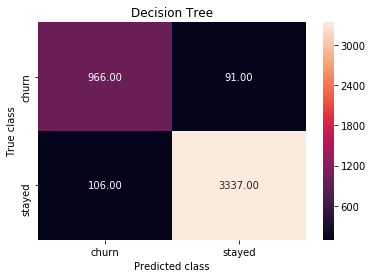

In [35]:
#confusion matrix desicion tree
from sklearn.metrics import confusion_matrix
from sklearn import metrics
dt_depth_100_y_pred = dt_depth_100.predict(X_test)
dt_depth_100_cm = metrics.confusion_matrix(dt_depth_100_y_pred, y_test, [1,0])
sns.heatmap(dt_depth_100_cm, annot=True, fmt='.2f',xticklabels = ["churn", "stayed"] , yticklabels = ["churn", "stayed"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Decision Tree')
plt.savefig('Decision_Tree')


##### Cross validation K-Fold for Decision Tree


In [36]:
#import useful libraries
from sklearn import model_selection
from sklearn.model_selection import cross_val_score

#10-fold cross validation 
kfold = model_selection.KFold(n_splits=10, random_state=7)
dt_cv = DecisionTreeClassifier(random_state=42)
scoring = 'accuracy'
results = model_selection.cross_val_score(dt_cv, X_train, y_train, cv=kfold, scoring=scoring)
print(results)


[0.97238095 0.96761905 0.96857143 0.96285714 0.95809524 0.9647619
 0.96380952 0.97047619 0.96380952 0.9742612 ]


In [37]:
#use average accuracy as an estimate of out of sample accuracy
print("10-fold cross validation average accuracy: %.3f" % (results.mean()))

10-fold cross validation average accuracy: 0.967


##### Decison Tree Visual Represenation

In [38]:
#import pydotplus, graphviz and digraph
import pydotplus as pdot
from graphviz import Digraph
from IPython.display import Image

#set targets, display graph and save
export_graphviz( dt,
                out_file = "hr_tree_1.odt",
                class_names = ['stayed', 'churn'],
                filled = True,
                feature_names = X_train.columns )
chd_tree_graph = pdot.graphviz.graph_from_dot_file( 'hr_tree_1.odt' )
chd_tree_graph.write_jpg( 'hr_tree_1.jpg' )
Image(filename='hr_tree_1.jpg')

##### Grid Search Optimal Parameters - Decision Tree 

In [39]:
#import model selection and gridsearchcv
from sklearn.model_selection import GridSearchCV

tuned_parameters = [{'max_depth': range(4,10),
                   'criterion': ['gini', 'entropy']}]

In [40]:
#import model selection and GridSearch libraries
from sklearn.model_selection import GridSearchCV

#initialize and call model
clf_dtree = DecisionTreeClassifier()
clf = GridSearchCV(clf_dtree,
                 tuned_parameters,
                 cv=5,
                 return_train_score = True,  
                 scoring='roc_auc')

#apply fit to target sets
clf.fit(X_train, y_train)


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid=[{'max_depth': range(4, 10), 'criterion': ['gini', 'entropy']}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='roc_auc', verbose=0)

In [41]:
#paremeter display
clf.best_params_

{'criterion': 'entropy', 'max_depth': 7}

In [42]:
#paremeter best estimation score
clf.best_score_

0.9779686577650967

# Task 10: Random Forest Classifier

##### Fit Random Forest 

In [43]:
#import the classification algorithm
from sklearn.ensemble import RandomForestClassifier

#initialize it and call model 
rf_clf = RandomForestClassifier()

#apply a decision tree model to fit features to the target
rf_clf.fit(X_train, y_train)

/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

##### Evaluate Random Forest Model

In [44]:
#check the accuracy score of the prediction for the training set
rf_clf.score(X_train, y_train)

0.9946661586817792

In [45]:
#check (1 method) the accuracy score of the prediction for the test set
from sklearn.metrics import accuracy_score
rf_clf.score(X_test, y_test)

0.9753333333333334

In [46]:
#check (2 method) the accuracy score of the prediction for the test set
from sklearn.metrics import accuracy_score
print('Random Forest Accuracy test set: {:.3f}'.format(accuracy_score(y_test, rf_clf.predict(X_test))))


Random Forest Accuracy test set: 0.975


##### Precicion and recall for Decision Tree

In [47]:
#calculate recall score by comparing y_test with the prediction
from sklearn.metrics import recall_score

#use the initial model to predict churn
prediction_rf = rf_clf.predict(X_test)

#calculate recall score by comparing y_test with the prediction
recall_score(y_test, prediction_rf)

0.9319029850746269

In [48]:
#import classification and metrics libraries
from sklearn.metrics import classification_report

#display classification report
print(classification_report(y_test, rf_clf.predict(X_test)))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      3428
           1       0.96      0.93      0.95      1072

   micro avg       0.98      0.98      0.98      4500
   macro avg       0.97      0.96      0.97      4500
weighted avg       0.98      0.98      0.98      4500



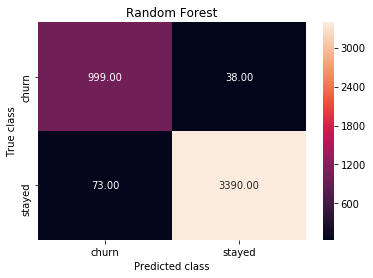

In [49]:
#confusion matrix random forest
from sklearn.metrics import confusion_matrix
from sklearn import metrics
import seaborn as sns
rf_y_pred = rf_clf.predict(X_test)
forest_cm = metrics.confusion_matrix(rf_y_pred, y_test, [1,0])
sns.heatmap(forest_cm, annot=True, fmt='.2f',xticklabels = ["churn", "stayed"] , yticklabels = ["churn", "stayed"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Random Forest')
plt.savefig('random_forest')

#####  Cross Validation K-Fold - Random Forest

In [50]:
#import useful libraries
from sklearn import model_selection
from sklearn.model_selection import cross_val_score

#10-fold cross validation 
kfold = model_selection.KFold(n_splits=10, random_state=7)
rf_cv = RandomForestClassifier()
scoring = 'accuracy'
results = model_selection.cross_val_score(rf_cv, X_train, y_train, cv=kfold, scoring=scoring)
print(results)


/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The de

[0.98666667 0.97619048 0.98       0.97619048 0.9752381  0.9752381
 0.97714286 0.98190476 0.98190476 0.97998093]


/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


In [51]:
#print mean of results
print("10-fold cross validation average accuracy: %.3f" % (results.mean()))

10-fold cross validation average accuracy: 0.979


##### Grid Search - Random Forest

In [52]:
tuned_parameters = [{'max_depth': [5,10,15],
                   'n_estimators': [10,50,100],
                   'max_features': [0.1,0.3,0.5]}]


In [53]:
#import model selection and GridSearch libraries
from sklearn.model_selection import GridSearchCV

#initialize and call model
radm_clf = RandomForestClassifier()
clf= GridSearchCV(radm_clf,tuned_parameters,cv=5,scoring='roc_auc')

#apply fit to target sets
clf.fit(X_train, y_train )

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid=[{'max_depth': [5, 10, 15], 'n_estimators': [10, 50, 100], 'max_features': [0.1, 0.3, 0.5]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=0)

In [54]:
#paremeter display
clf.best_params_

{'max_depth': 10, 'max_features': 0.5, 'n_estimators': 100}

In [55]:
#paremeter best estimation score
clf.best_score_

0.9877077464887867

#####  Building the Final Model - Random Forest

In [56]:
#initialize it and call model 
radm_clf = RandomForestClassifier( max_depth = 15,max_features = 0.5,n_estimators = 100)

#apply a decision tree model to fit features to the target
radm_clf.fit( X_train, y_train )

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=15, max_features=0.5, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [57]:
radm_test_pred = pd.DataFrame( { 'actual':  y_test,
                              'predicted': radm_clf.predict( X_test ) } )

In [58]:
#print auccuarcy score 
metrics.roc_auc_score( radm_test_pred.actual, radm_test_pred.predicted )

0.965714201745067

#####  Feature Importance - Random Forest

In [59]:
#display features statistic array
radm_clf.feature_importances_

array([0.51854003, 0.18280637, 0.26457196, 0.0101788 , 0.00134341,
       0.00245106, 0.00241207, 0.00232511, 0.0061498 , 0.00922139])

In [60]:
#array of indices that sort a along the specified axis

indices = np.argsort(radm_clf.feature_importances_)[::-1]

feature_rank = pd.DataFrame( columns = ['rank', 'feature', 'importance'] )
for f in range(X_train.shape[1]):
    feature_rank.loc[f] = [f+1,
                           X_train.columns[indices[f]],
                           radm_clf.feature_importances_[indices[f]]]


    


In [61]:
#display feature rank table
feature_rank

,rank,feature,importance
0,1,satisfaction,0.518540
1,2,time_spend_company,0.264572
2,3,evaluation,0.182806
3,4,work_accident,0.010179
4,5,salary_low,0.009221
5,6,salary_high,0.006150
6,7,department_RandD,0.002451
7,8,department_hr,0.002412
8,9,department_management,0.002325
9,10,promotion_last_5years,0.001343


Using matplotlib backend: Qt5Agg


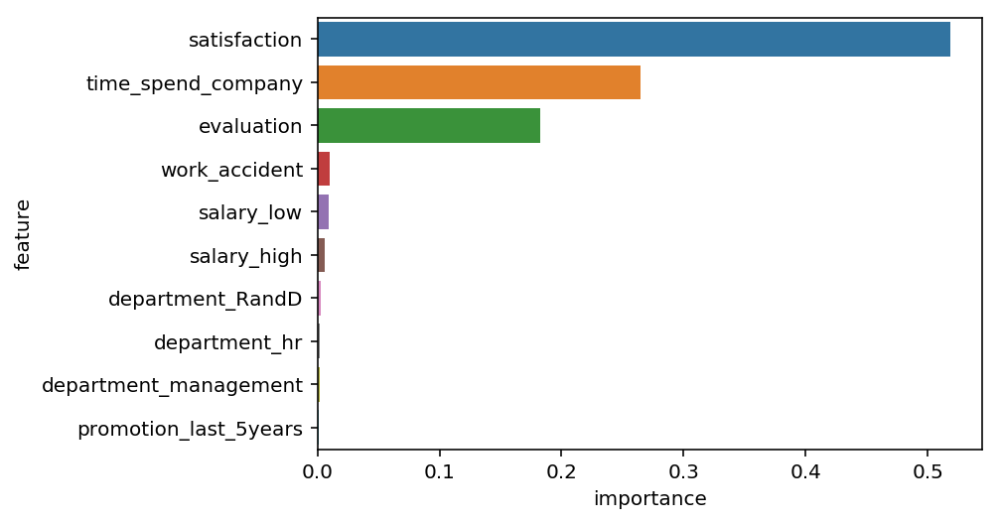

In [62]:
import matplotlib.pyplot as plt
import seaborn as sn
%matplotlib 
sn.barplot( y = 'feature', x = 'importance', data = feature_rank );

# Task 11: Support Vector Classifier

##### Fit Support Vector 

In [63]:
#import the classification algorithm
from sklearn.svm import SVC

#initialize it and call model 
svc = SVC()

#apply a decision tree model to fit features to the target
svc.fit(X_train, y_train)

/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

##### Evaluate Support Vector Model

In [64]:
# Check the accuracy score of the prediction for the training set
svc.score(X_train, y_train) 

0.9103724164206115

In [65]:
#check the accuracy score of the prediction for the test set
print('Support vector machine accuracy: {:.3f}'.format(accuracy_score(y_test, svc.predict(X_test))))


Support vector machine accuracy: 0.902


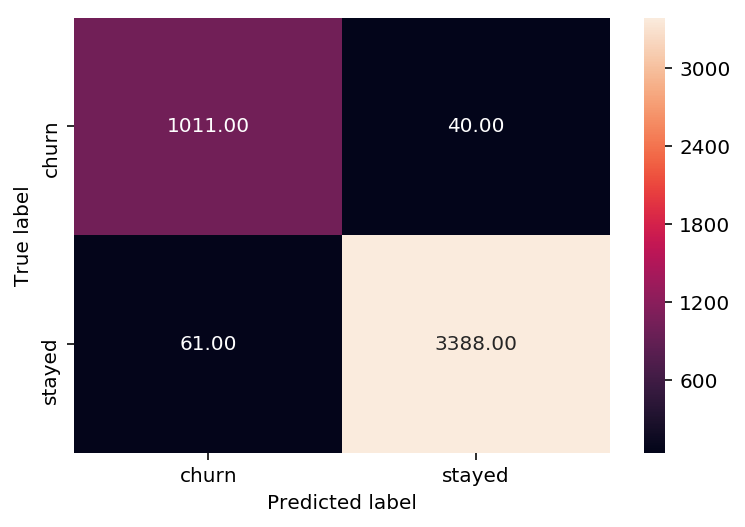

In [66]:
import seaborn as sns;
from sklearn.metrics import confusion_matrix
from sklearn import metrics

tree_cm = metrics.confusion_matrix( radm_test_pred.predicted, 
                                   radm_test_pred.actual, 
                                   [1,0] )
sn.heatmap(tree_cm, annot=True,  
           fmt='.2f', 
           xticklabels = ["churn", "stayed"] , yticklabels = ["churn", "stayed"] )

plt.ylabel('True label')
plt.xlabel('Predicted label');


##### Precicion and recall for Support Vector

In [67]:
#calculate recall score by comparing y_test with the prediction
from sklearn.metrics import recall_score

#use the initial model to predict churn
prediction_svc = svc.predict(X_test)

#calculate recall score by comparing y_test with the prediction
recall_score(y_test, prediction_svc)

0.8432835820895522

In [68]:
#import classification report and metrics libraries
from sklearn.metrics import classification_report

#display classification report
print(classification_report(y_test, svc.predict(X_test)))

              precision    recall  f1-score   support

           0       0.95      0.92      0.93      3428
           1       0.77      0.84      0.80      1072

   micro avg       0.90      0.90      0.90      4500
   macro avg       0.86      0.88      0.87      4500
weighted avg       0.91      0.90      0.90      4500



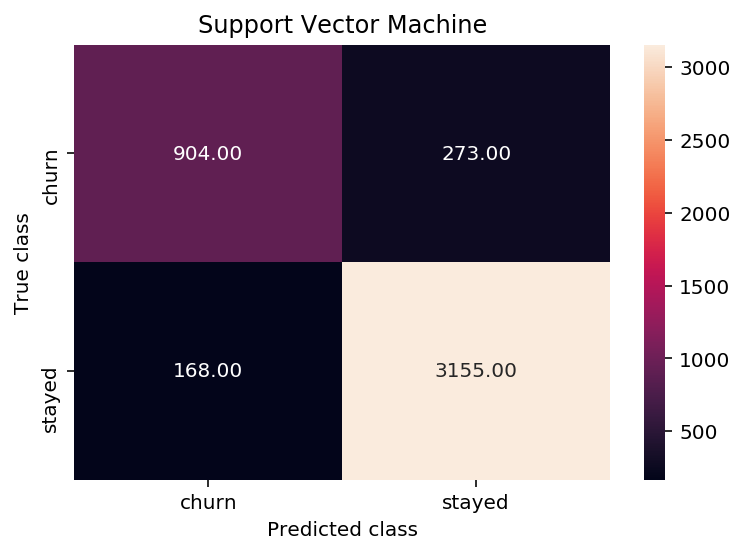

In [69]:
#confusion matrix support vector machine 
from sklearn.metrics import confusion_matrix
from sklearn import metrics
svc_y_pred = svc.predict(X_test)
svc_cm = metrics.confusion_matrix(svc_y_pred, y_test, [1,0])
sns.heatmap(svc_cm, annot=True, fmt='.2f',xticklabels = ["churn", "stayed"] , yticklabels = ["churn", "stayed"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Support Vector Machine')
plt.savefig('support_vector_machine')

#####  Cross Validation K-Fold - Support Vector

In [70]:
#import model selection and validation score
from sklearn.model_selection import cross_val_score

#10-fold cross validation 
kfold = model_selection.KFold(n_splits=10, random_state=7)
svc_cv = SVC()
scoring = 'accuracy'
results = model_selection.cross_val_score(svc_cv, X_train, y_train, cv=kfold, scoring=scoring)
print(results)



/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default 

[0.90761905 0.91142857 0.91428571 0.90571429 0.90571429 0.90571429
 0.91714286 0.90285714 0.90571429 0.91706387]


In [71]:

print("10-fold cross validation average accuracy: %.3f" % (results.mean()))

10-fold cross validation average accuracy: 0.909


# Task 12: K-Nearest Neighbor Classifier

##### Fit K-Nearest Neighbor Classifier to dataset

In [72]:
# Import the classification algorithm
from sklearn.neighbors import KNeighborsClassifier

# Initialize it and call model 
knn = KNeighborsClassifier(n_neighbors=5)

# Apply a decision tree model to fit features to the target
knn.fit(X_train, y_train)


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform')

##### Evaluate K-Nearest Neighbor Model

In [73]:
# Check the accuracy score of the prediction for the test set
knn.score(X_train, y_train)


0.9673302219258977

In [74]:
# Check the accuracy score of the prediction for the training set
knn.score(X_test, y_test) 

0.9491111111111111

In [75]:
# Check (2 Method) the accuracy score of the prediction for the test set
print('K-Nearest Neighbor machine accuracy: {:.3f}'.format(accuracy_score(y_test, knn.predict(X_test))))

K-Nearest Neighbor machine accuracy: 0.949


##### Precicion and recall for K-Nearest Neighbor

In [76]:
#import the function to calculate recall score
from sklearn.metrics import recall_score

#use the initial model to predict churn
prediction_knn = knn.predict(X_test)

#calculate recall score by comparing y_test with the prediction
recall_score(y_test, prediction_knn)


0.8936567164179104

In [77]:
#import classification and metrics libraries
from sklearn.metrics import classification_report

#display classification report
print(classification_report(y_test, knn.predict(X_test)))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97      3428
           1       0.89      0.89      0.89      1072

   micro avg       0.95      0.95      0.95      4500
   macro avg       0.93      0.93      0.93      4500
weighted avg       0.95      0.95      0.95      4500



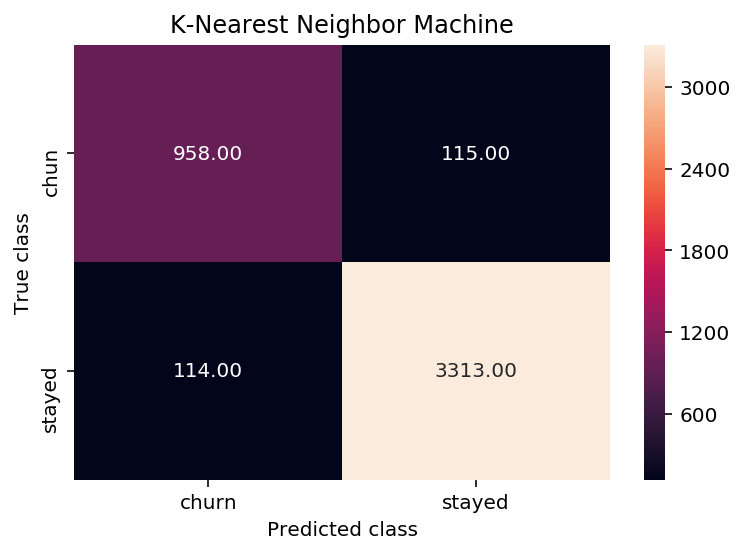

In [78]:
#confusion matrix k-nearest neighbor
from sklearn.metrics import confusion_matrix
from sklearn import metrics
knn_y_pred = knn.predict(X_test)
knn_cm = metrics.confusion_matrix(knn_y_pred, y_test, [1,0])
sns.heatmap(knn_cm, annot=True, fmt='.2f',xticklabels = ["churn", "stayed"] , yticklabels = ["chun", "stayed"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('K-Nearest Neighbor Machine')
plt.savefig('k-nearest_neighbor_machine')

##### Cross Validation K-Fold - KNN Neighbor

In [79]:
#import model selection and validation score
from sklearn import model_selection
from sklearn.model_selection import cross_val_score

#10-fold cross validation 
kfold = model_selection.KFold(n_splits=10, random_state=7)
knn_cv = KNeighborsClassifier(n_neighbors=5)
scoring = 'accuracy'
results = model_selection.cross_val_score(knn_cv, X_train, y_train, cv=kfold, scoring=scoring)
print(results)

[0.95809524 0.95238095 0.9552381  0.95428571 0.9447619  0.95047619
 0.94095238 0.94857143 0.95714286 0.95424214]


In [80]:
print("10-fold cross validation average accuracy: %.3f" % (results.mean()))

10-fold cross validation average accuracy: 0.952


##### Grid Search - KNN Neighbor

In [81]:
tuned_parameters = [{'n_neighbors': [5, 10, 15, 20]}]

In [82]:
#import model selection and GridSearch libraries
from sklearn.model_selection import GridSearchCV

#initialize and call model
clf = GridSearchCV(KNeighborsClassifier(),
                 tuned_parameters,
                 cv=5,
                 scoring='roc_auc')

#apply fit to target sets
clf.fit(X_train, y_train )

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid=[{'n_neighbors': [5, 10, 15, 20]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=0)

In [83]:
#paremeter display
clf.best_params_

{'n_neighbors': 10}

In [84]:
#paremeter best estimation score
clf.best_score_

0.9720874775911477

In [85]:
#import the function to calculate recall score
from sklearn.metrics import recall_score

#use the initial model to predict churn
prediction_knn2 = clf.predict(X_test)

#calculate recall score by comparing y_test with the prediction
recall_score(y_test, prediction_knn2)


0.8759328358208955

# Task 14: Naive Bayes Neighbor Classifier

##### Fit Naive Bayes

In [86]:
# Import the classification algorithm
from sklearn.naive_bayes import GaussianNB

# Initialize it and call model 
nb = GaussianNB()

# Apply a decision tree model to fit features to the target
nb.fit(X_train, y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

##### Evaluate Naive Bayes Model

In [87]:
# Check the accuracy score of the prediction for the training set
nb.score(X_train, y_train) 

0.578721783026955

In [88]:
# Check (1 method) the accuracy score of the prediction for the test set
nb.score(X_test, y_test)

0.5693333333333334

In [89]:
# Check (2 Method) the accuracy score of the prediction for the test set
print('Naive Bayes machine accuracy: {:.3f}'.format(accuracy_score(y_test, nb.predict(X_test))))


Naive Bayes machine accuracy: 0.569


##### Precicion and recall - Naive Bayes Neighbor

In [90]:
# Import the function to calculate recall score
from sklearn.metrics import recall_score


# Use the initial model to predict churn
prediction_nb = nb.predict(X_test)

# Calculate recall score by comparing y_test with the prediction
recall_score(y_test, prediction_nb)



0.8544776119402985

In [91]:
print(classification_report(y_test, nb.predict(X_test)))

              precision    recall  f1-score   support

           0       0.91      0.48      0.63      3428
           1       0.34      0.85      0.49      1072

   micro avg       0.57      0.57      0.57      4500
   macro avg       0.63      0.67      0.56      4500
weighted avg       0.78      0.57      0.60      4500



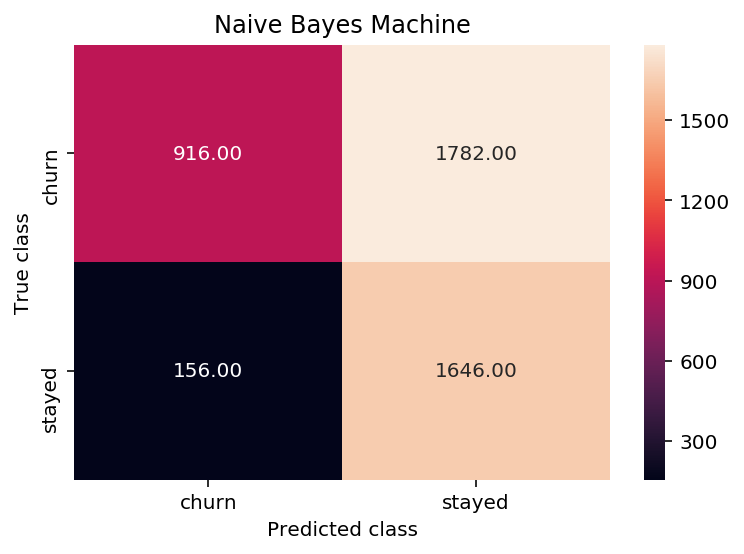

In [92]:
#confusion matrix naive bayes
from sklearn.metrics import confusion_matrix
from sklearn import metrics
nb_y_pred = nb.predict(X_test)
nb_cm = metrics.confusion_matrix(nb_y_pred, y_test, [1,0])
sns.heatmap(nb_cm, annot=True, fmt='.2f',xticklabels = ["churn", "stayed"] , yticklabels = ["churn", "stayed"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Naive Bayes Machine')
plt.savefig('naive_bayes_machine')

###### Cross Validation K-Fold - Naive Bayes

In [93]:
#import model selection and validation score
from sklearn import model_selection
from sklearn.model_selection import cross_val_score

#10-fold cross validation 
kfold = model_selection.KFold(n_splits=10, random_state=7)
nb_cv = GaussianNB()
scoring = 'accuracy'
results = model_selection.cross_val_score(nb_cv, X_train, y_train, cv=kfold, scoring=scoring)
print(results)
print("10-fold cross validation average accuracy: %.3f" % (results.mean()))

[0.54952381 0.60095238 0.57238095 0.57809524 0.57904762 0.54952381
 0.63238095 0.59333333 0.5552381  0.56816015]
10-fold cross validation average accuracy: 0.578


# Task 14: Logistic Regression Classifier

##### Fit Logistic Regression

In [94]:
#import the classification algorithm
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

#initialize it and call model 
logreg = LogisticRegression()

#apply a decision tree model to fit features to the target
logreg.fit(X_train, y_train)

/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

##### Evaluate Logistic Regression Model

In [95]:
y_pred_lg = logreg.predict(X_test)

In [97]:
#check the accuracy score of the prediction for the training set
logreg.score(X_train, y_train)

0.7695971044861415

In [98]:
#check (2 Method) accuracy score of the prediction for the test set
print('Logistic regression accuracy: {:.3f}'.format(accuracy_score(y_test, logreg.predict(X_test))))


Logistic regression accuracy: 0.761


##### Precicion and recall - Logistic Regression 

In [99]:
# Import the function to calculate recall score
from sklearn.metrics import recall_score

# Use the initial model to predict churn
prediction_logreg = nb.predict(X_test)

# Calculate recall score by comparing y_test with the prediction
recall_score(y_test, prediction_logreg)

0.8544776119402985

In [100]:
from sklearn.metrics import classification_report
print(classification_report(y_test, logreg.predict(X_test)))




              precision    recall  f1-score   support

           0       0.80      0.92      0.85      3428
           1       0.50      0.25      0.33      1072

   micro avg       0.76      0.76      0.76      4500
   macro avg       0.65      0.58      0.59      4500
weighted avg       0.73      0.76      0.73      4500



Text(0.5, 1.0, 'Logistic Regression')

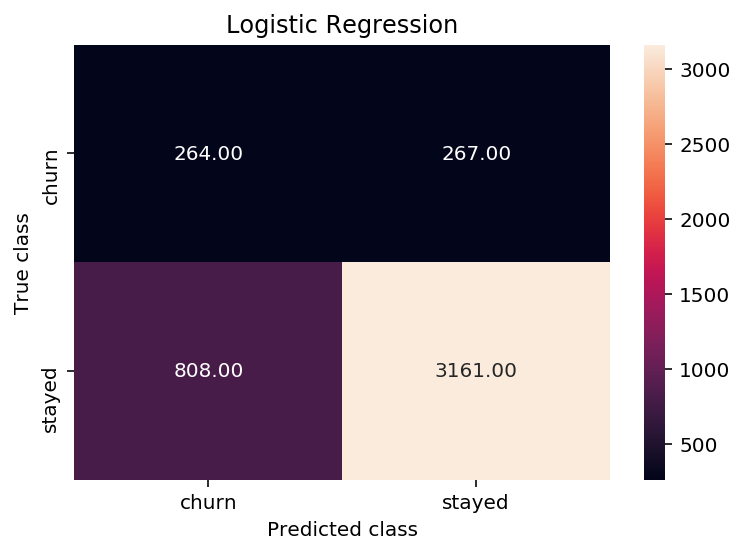

In [101]:
#confusion matrix logistic regression
logreg_y_pred = logreg.predict(X_test)
logreg_cm = metrics.confusion_matrix(logreg_y_pred, y_test, [1,0])
sns.heatmap(logreg_cm, annot=True, fmt='.2f',xticklabels = ["churn", "stayed"] , yticklabels = ["churn", "stayed"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Logistic Regression')


#### Cross Validation K-Fold - Logistic Regression

In [102]:
#import model selection and validation score
from sklearn import model_selection
from sklearn.model_selection import cross_val_score

#10-fold cross validation 
kfold = model_selection.KFold(n_splits=10, random_state=7)
lr_cv = LogisticRegression()
scoring = 'accuracy'
results = model_selection.cross_val_score(lr_cv, X_train, y_train, cv=kfold, scoring=scoring)
print(results)
print("10-fold cross validation average accuracy: %.3f" % (results.mean()))

/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  Futur

[0.78380952 0.76285714 0.77904762 0.74095238 0.76380952 0.77714286
 0.77619048 0.7552381  0.78       0.78169685]
10-fold cross validation average accuracy: 0.770


/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


# Task 14: Roc AUC Score and ROC Curve Visulzation 

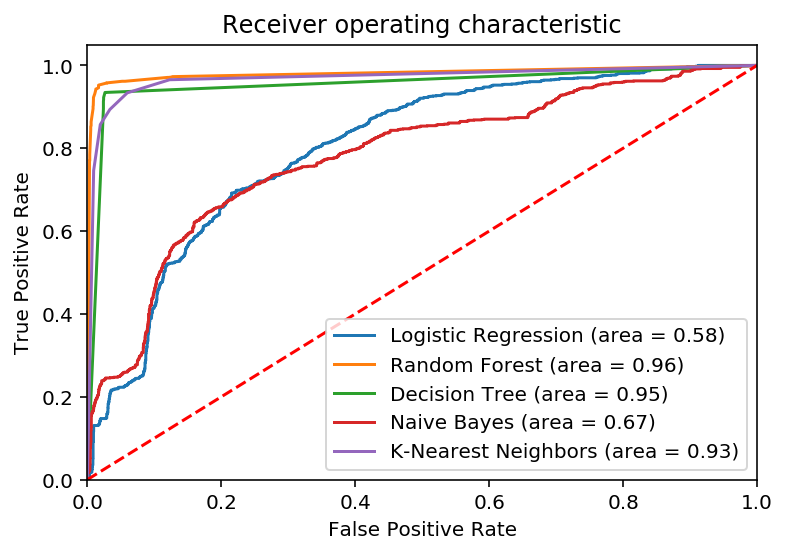

In [110]:
#import metrics roc auc score androc vurve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

#set auc score and roc curve for logistic regression 
logreg_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
logreg_fpr, logreg_tpr, logreg_thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])

#set auc score and roc curve for random forest
rf_clf_roc_auc = roc_auc_score(y_test, rf_clf.predict(X_test))
rf_clf_fpr, rf_clf_tpr, rf_clf_thresholds = roc_curve(y_test, rf_clf.predict_proba(X_test)[:,1])

#set auc score and roc curve for logistic regression 
dt_roc_auc = roc_auc_score(y_test, dt.predict(X_test))
dt_fpr, dt_tpr, dt_thresholds = roc_curve(y_test, dt.predict_proba(X_test)[:,1])


#set auc score and roc curve for K-Nearest Neighbor
knn_roc_auc = roc_auc_score(y_test, knn.predict(X_test))
knn_fpr, knn_tpr, knn_thresholds = roc_curve(y_test, knn.predict_proba(X_test)[:,1])

#set auc score and roc curve for Naive Bayes
nb_roc_auc = roc_auc_score(y_test, nb.predict(X_test))
nb_fpr, nb_tpr, nb_thresholds = roc_curve(y_test, nb.predict_proba(X_test)[:,1])



plt.figure()
plt.plot(logreg_fpr, logreg_tpr, label='Logistic Regression (area = %0.2f)' % logreg_roc_auc)
plt.plot(rf_clf_fpr, rf_clf_tpr, label='Random Forest (area = %0.2f)' % rf_clf_roc_auc)
plt.plot(dt_fpr, dt_tpr, label='Decision Tree (area = %0.2f)' % dt_roc_auc)
plt.plot(nb_fpr, nb_tpr, label='Naive Bayes (area = %0.2f)' % nb_roc_auc)
plt.plot(knn_fpr, knn_tpr, label='K-Nearest Neighbors (area = %0.2f)' % knn_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('ROC')
plt.show()